<a href="https://colab.research.google.com/github/RubenCarty/Master-Artificial-Intelligence-UNIR/blob/main/Lab_Actividad_1_Solucion_Ruben_Quispe.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

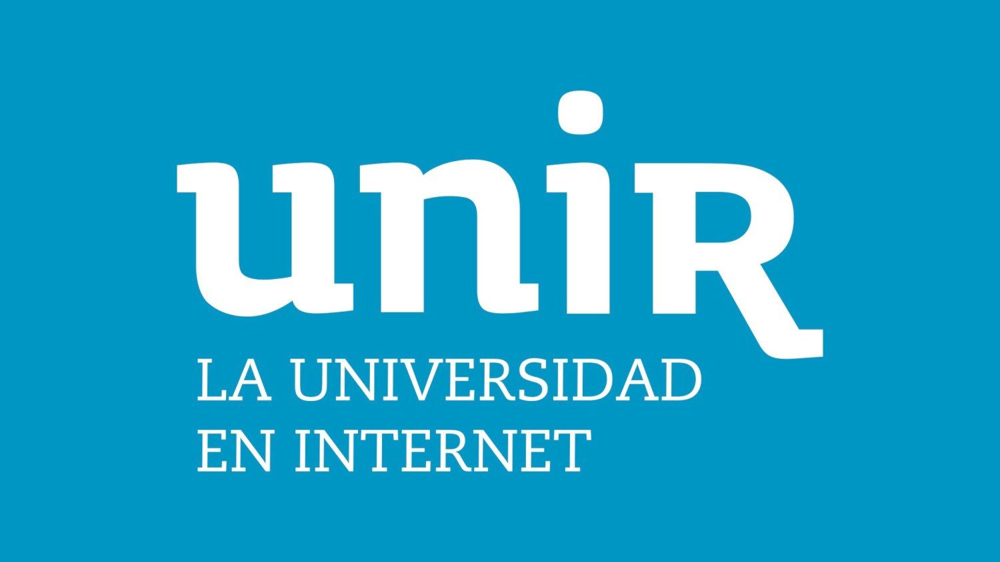

\_Aprendizaje Automático_

_Máster Universitario en Inteligencia Artificial_

# Laboratorio: Regresión lineal y árboles de decisión para tareas de regresión


## Objetivos

Mediante esta actividad se pretende que ponga en práctica los pasos para la resolución de un problema de machine learning, el tratamiento de datos y la creación de modelos basados en regresión lineal y árboles de decisión. El objetivo es comprender de forma práctica con un problema determinado las diferencias que existen a la hora de entrenar los diferentes modelos.

- Iniciarse en el Análisis Exploratorio de Datos (EDA) para los problemas de Machine Learning.
- Entender y aplicar los conceptos de la Regresión Lineal Múltiple a un problema de regresión.
- Entender y aplicar los conceptos de Árboles de Decisión a un problema de regresión.
- Evaluar y analizar los resultados de los regresores.
- Investigar la aplicación de los modelos de regresión a problemas reales.


## Descripción de la actividad

Debes completar los espacios indicados en el notebook con el código solicitado y la respuesta, en función de lo que se solicite. Ten encuenta que las celdas vacías indican cuántas líneas debe ocupar la respuesta, por lo general no más de una línea.

El conjunto de datos con el que vamos a trabajar se encuentra en el siguiente enlace: https://archive.ics.uci.edu/dataset/360/air+quality

Se trata de un dataset con un conjunto de datos sobre calidad del aire. El conjunto de datos contiene 9358 instancias de respuestas promediadas por hora de una matriz de 5 sensores químicos de óxido de metal integrados en un dispositivo multisensor químico de calidad del aire. El dispositivo estaba ubicado en un área significativamente contaminada, al nivel de la carretera, dentro de una ciudad italiana. Los datos se registraron desde marzo de 2004 hasta febrero de 2005 (un año).

El objetivo de la regresión será predecir la calidad del aire para un determinado día.

### Tareas que se deben realizar

- Análisis descriptivo de los datos:
   - Debe completarse el código solicitado y responder a las preguntas. Todo ello en el notebook dado como base.
- Regresión:
  - Debe completarse el código solicitado y responder a las preguntas. Todo ello en el notebook dado como base.
- Investigación:
  - Buscar un artículo científico (https://scholar.google.es/) con un caso de uso de regresión empleando una de las dos técnicas (o ambas) vistas en la actividad. Los artículos deben estar en revistas científicas, y deben ser posteriores a 2015. No debe utilizar técnicas de Deep Learning.
  - Para el artículo indicar:
    - Objetivo: cuál es el objetivo de la investigación, es decir a qué problema real está aplicando la regresión.
    - Cómo utilizan las técnicas de regresión, si realizan alguna adaptación de los algoritmos indicarse.
    - Principales resultados de la aplicación y de la investigación.


### Análisis descriptivo de los datos
A continuación vas a encontrar una serie de preguntas que tendrás que responder. Para responder tendrás que escribir (y ejecutar) una (o más de una) línea de código, y a continuación indicar la respuesta en la celda indicada.

In [1]:
## cargar el dataset
import pandas as pd
import numpy as np
df = pd.read_csv('/content/AirQualityUCI.csv', delimiter=';')

In [2]:
df

,Date,Time,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH,Unnamed: 15,Unnamed: 16
0,10/03/2004,18.00.00,"2,6",1360.0,150.0,"11,9",1046.0,166.0,1056.0,113.0,1692.0,1268.0,"13,6","48,9","0,7578",NaN,NaN
1,10/03/2004,19.00.00,2,1292.0,112.0,"9,4",955.0,103.0,1174.0,92.0,1559.0,972.0,"13,3","47,7","0,7255",NaN,NaN
2,10/03/2004,20.00.00,"2,2",1402.0,88.0,"9,0",939.0,131.0,1140.0,114.0,1555.0,1074.0,"11,9","54,0","0,7502",NaN,NaN
3,10/03/2004,21.00.00,"2,2",1376.0,80.0,"9,2",948.0,172.0,1092.0,122.0,1584.0,1203.0,"11,0","60,0","0,7867",NaN,NaN
4,10/03/2004,22.00.00,"1,6",1272.0,51.0,"6,5",836.0,131.0,1205.0,116.0,1490.0,1110.0,"11,2","59,6","0,7888",NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9466,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9467,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9468,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9469,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Eliminamos la columna 15 y 16

In [23]:
import pandas as pd
import numpy as np

# Cargar el dataset
df = pd.read_csv('/content/AirQualityUCI.csv', sep=';', decimal=',', encoding='latin1')

# Eliminar columnas vacías
df.drop(columns=['Unnamed: 15', 'Unnamed: 16'], inplace=True)

# Reemplazar -200 (valores perdidos codificados) por NaN
df.replace(-200, np.nan, inplace=True)

# Mostrar info
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9471 entries, 0 to 9470
Data columns (total 15 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           9357 non-null   object 
 1   Time           9357 non-null   object 
 2   CO(GT)         7674 non-null   float64
 3   PT08.S1(CO)    8991 non-null   float64
 4   NMHC(GT)       914 non-null    float64
 5   C6H6(GT)       8991 non-null   float64
 6   PT08.S2(NMHC)  8991 non-null   float64
 7   NOx(GT)        7718 non-null   float64
 8   PT08.S3(NOx)   8991 non-null   float64
 9   NO2(GT)        7715 non-null   float64
 10  PT08.S4(NO2)   8991 non-null   float64
 11  PT08.S5(O3)    8991 non-null   float64
 12  T              8991 non-null   float64
 13  RH             8991 non-null   float64
 14  AH             8991 non-null   float64
dtypes: float64(13), object(2)
memory usage: 1.1+ MB


In [4]:
df

,Date,Time,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
0,10/03/2004,18.00.00,2.6,1360.0,150.0,11.9,1046.0,166.0,1056.0,113.0,1692.0,1268.0,13.6,48.9,0.7578
1,10/03/2004,19.00.00,2.0,1292.0,112.0,9.4,955.0,103.0,1174.0,92.0,1559.0,972.0,13.3,47.7,0.7255
2,10/03/2004,20.00.00,2.2,1402.0,88.0,9.0,939.0,131.0,1140.0,114.0,1555.0,1074.0,11.9,54.0,0.7502
3,10/03/2004,21.00.00,2.2,1376.0,80.0,9.2,948.0,172.0,1092.0,122.0,1584.0,1203.0,11.0,60.0,0.7867
4,10/03/2004,22.00.00,1.6,1272.0,51.0,6.5,836.0,131.0,1205.0,116.0,1490.0,1110.0,11.2,59.6,0.7888
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9466,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9467,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9468,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9469,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [5]:
# Establecer opción para mostrar todas las filas
pd.set_option('display.max_rows', None)

# Mostrar todas las filas del DataFrame
display(df)

,Date,Time,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
0,10/03/2004,18.00.00,2.6,1360.0,150.0,11.9,1046.0,166.0,1056.0,113.0,1692.0,1268.0,13.6,48.9,0.7578
1,10/03/2004,19.00.00,2.0,1292.0,112.0,9.4,955.0,103.0,1174.0,92.0,1559.0,972.0,13.3,47.7,0.7255
2,10/03/2004,20.00.00,2.2,1402.0,88.0,9.0,939.0,131.0,1140.0,114.0,1555.0,1074.0,11.9,54.0,0.7502
3,10/03/2004,21.00.00,2.2,1376.0,80.0,9.2,948.0,172.0,1092.0,122.0,1584.0,1203.0,11.0,60.0,0.7867
4,10/03/2004,22.00.00,1.6,1272.0,51.0,6.5,836.0,131.0,1205.0,116.0,1490.0,1110.0,11.2,59.6,0.7888
5,10/03/2004,23.00.00,1.2,1197.0,38.0,4.7,750.0,89.0,1337.0,96.0,1393.0,949.0,11.2,59.2,0.7848
6,11/03/2004,00.00.00,1.2,1185.0,31.0,3.6,690.0,62.0,1462.0,77.0,1333.0,733.0,11.3,56.8,0.7603
7,11/03/2004,01.00.00,1.0,1136.0,31.0,3.3,672.0,62.0,1453.0,76.0,1333.0,730.0,10.7,60.0,0.7702
8,11/03/2004,02.00.00,0.9,1094.0,24.0,2.3,609.0,45.0,1579.0,60.0,1276.0,620.0,10.7,59.7,0.7648
9,11/03/2004,03.00.00,0.6,1010.0,19.0,1.7,561.0,NaN,1705.0,NaN,1235.0,501.0,10.3,60.2,0.7517


In [ ]:
## ¿cuántas instancias tiene el dataset?

In [ ]:
print(f"Cantidad de instancias (filas): {df.shape[0]}")


Cantidad de instancias (filas): 9471


In [ ]:
df.shape

(9471, 15)

Cuando imprimimos tenemos 9471 instancias porque habiamos cargado 114 filas vacias.
Sin embaro como tenemos el link asociado de este dataset y en link nos dice que hay **9357 instancias que son utiles que son reales**

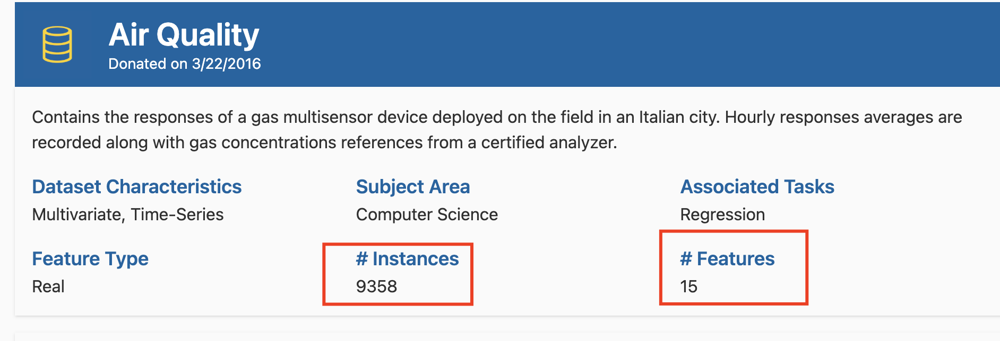

In [6]:
## ¿cuál es el tipo de datos de cada una de las columnas?
print(df.dtypes)


Date              object
Time              object
CO(GT)           float64
PT08.S1(CO)      float64
NMHC(GT)         float64
C6H6(GT)         float64
PT08.S2(NMHC)    float64
NOx(GT)          float64
PT08.S3(NOx)     float64
NO2(GT)          float64
PT08.S4(NO2)     float64
PT08.S5(O3)      float64
T                float64
RH               float64
AH               float64
dtype: object


_indica aquí tu respuesta_
Tenemos 2 opciones aquí: haber cargado el conjunto con los decimales bien definido o que se hayan cargado mal los tipos de datos  y tener  que darse cuenta de los errores

In [15]:
# respuesta
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9471 entries, 0 to 9470
Data columns (total 15 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           9357 non-null   object 
 1   Time           9357 non-null   object 
 2   CO(GT)         7674 non-null   float64
 3   PT08.S1(CO)    8991 non-null   float64
 4   NMHC(GT)       914 non-null    float64
 5   C6H6(GT)       8991 non-null   float64
 6   PT08.S2(NMHC)  8991 non-null   float64
 7   NOx(GT)        7718 non-null   float64
 8   PT08.S3(NOx)   8991 non-null   float64
 9   NO2(GT)        7715 non-null   float64
 10  PT08.S4(NO2)   8991 non-null   float64
 11  PT08.S5(O3)    8991 non-null   float64
 12  T              8991 non-null   float64
 13  RH             8991 non-null   float64
 14  AH             8991 non-null   float64
dtypes: float64(13), object(2)
memory usage: 1.1+ MB


In [16]:
df['CO(GT)'] = df['CO(GT)'].astype(float)
df['C6H6(GT)'] = df['C6H6(GT)'].astype(float)
df['T'] = df['T'].astype(float)
df['RH'] = df['RH'].astype(float)
df['AH'] = df['AH'].astype(float)


In [18]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9471 entries, 0 to 9470
Data columns (total 15 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           9357 non-null   object 
 1   Time           9357 non-null   object 
 2   CO(GT)         7674 non-null   float64
 3   PT08.S1(CO)    8991 non-null   float64
 4   NMHC(GT)       914 non-null    float64
 5   C6H6(GT)       8991 non-null   float64
 6   PT08.S2(NMHC)  8991 non-null   float64
 7   NOx(GT)        7718 non-null   float64
 8   PT08.S3(NOx)   8991 non-null   float64
 9   NO2(GT)        7715 non-null   float64
 10  PT08.S4(NO2)   8991 non-null   float64
 11  PT08.S5(O3)    8991 non-null   float64
 12  T              8991 non-null   float64
 13  RH             8991 non-null   float64
 14  AH             8991 non-null   float64
dtypes: float64(13), object(2)
memory usage: 1.1+ MB


In [17]:
print(df[['CO(GT)', 'C6H6(GT)', 'T', 'RH', 'AH']].dtypes)


CO(GT)      float64
C6H6(GT)    float64
T           float64
RH          float64
AH          float64
dtype: object


In [19]:
## ¿cuántas columnas categóricas hay? ¿y cuántas continuas?
categorical_cols = df.select_dtypes(include='object').columns
numerical_cols = df.select_dtypes(include=[np.number]).columns

print(f"Columnas categóricas: {len(categorical_cols)} => {list(categorical_cols)}")
print(f"Columnas numéricas: {len(numerical_cols)} => {list(numerical_cols)}")


Columnas categóricas: 2 => ['Date', 'Time']
Columnas numéricas: 13 => ['CO(GT)', 'PT08.S1(CO)', 'NMHC(GT)', 'C6H6(GT)', 'PT08.S2(NMHC)', 'NOx(GT)', 'PT08.S3(NOx)', 'NO2(GT)', 'PT08.S4(NO2)', 'PT08.S5(O3)', 'T', 'RH', 'AH']


_indica aquí tu respuesta_
Hay 2 categorias, 13 continuas. Es necesario detectar que en algunos casos, se han cargado 2 filas sin informacion

In [21]:
## ¿existen valores nulos en el dataset?
nulls = df.isnull().sum()
print(nulls[nulls > 0])


Date              114
Time              114
CO(GT)           1797
PT08.S1(CO)       480
NMHC(GT)         8557
C6H6(GT)          480
PT08.S2(NMHC)     480
NOx(GT)          1753
PT08.S3(NOx)      480
NO2(GT)          1756
PT08.S4(NO2)      480
PT08.S5(O3)       480
T                 480
RH                480
AH                480
dtype: int64


haciendo limpieza de la data EDA, realice un analices exploratorio de datos

In [24]:
import pandas as pd
import numpy as np

# Cargar el dataset con coma como decimal
df = pd.read_csv('/content/AirQualityUCI.csv', sep=';', decimal=',', encoding='latin1')

# Eliminar columnas basura al final (Unnamed)
df.drop(columns=['Unnamed: 15', 'Unnamed: 16'], inplace=True)

# Eliminar filas completamente vacías (que aparecen al final del archivo)
df.dropna(how='all', inplace=True)

# Reemplazar el valor -200 por np.nan para que sea reconocido como nulo
df.replace(-200, np.nan, inplace=True)

# Confirmar forma original (debería ser 9357 filas, 15 columnas)
print(df.shape)  # Esperado: (9357, 15)

# Convertir columnas con tipo object (textuales) que realmente son números
cols_to_convert = ['CO(GT)', 'C6H6(GT)', 'T', 'RH', 'AH']
for col in cols_to_convert:
    if df[col].dtype == 'object':
        df[col] = df[col].str.replace(',', '.').astype(float)

# Ahora imputar valores nulos (opcional, solo si vas a entrenar modelos)
# Por ejemplo, usando la media de cada columna
df.fillna(df.mean(numeric_only=True), inplace=True)

# Confirmar que no quedan nulos
print(df.isnull().sum())

# Ver información final
df.info()


(9357, 15)
Date             0
Time             0
CO(GT)           0
PT08.S1(CO)      0
NMHC(GT)         0
C6H6(GT)         0
PT08.S2(NMHC)    0
NOx(GT)          0
PT08.S3(NOx)     0
NO2(GT)          0
PT08.S4(NO2)     0
PT08.S5(O3)      0
T                0
RH               0
AH               0
dtype: int64
<class 'pandas.core.frame.DataFrame'>
Index: 9357 entries, 0 to 9356
Data columns (total 15 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           9357 non-null   object 
 1   Time           9357 non-null   object 
 2   CO(GT)         9357 non-null   float64
 3   PT08.S1(CO)    9357 non-null   float64
 4   NMHC(GT)       9357 non-null   float64
 5   C6H6(GT)       9357 non-null   float64
 6   PT08.S2(NMHC)  9357 non-null   float64
 7   NOx(GT)        9357 non-null   float64
 8   PT08.S3(NOx)   9357 non-null   float64
 9   NO2(GT)        9357 non-null   float64
 10  PT08.S4(NO2)   9357 non-null   float64
 11  PT08.S5(O3) 

In [25]:
df.isnull().sum()

,0
Date,0
Time,0
CO(GT),0
PT08.S1(CO),0
NMHC(GT),0
C6H6(GT),0
PT08.S2(NMHC),0
NOx(GT),0
PT08.S3(NOx),0
NO2(GT),0


_indica aquí tu respuesta_

• Si el dataset está mal cargado, sí que tendremos filas y columnas vacías.

• Si el dataset está bien cargado, no tendremos datos nulos utilizando el comando habitula.

En cualquiera de los dos casos es necesario mencionar que, en este conjunto de datos, el -200 indica que es un valor nulo. Esto se podrá decir más
adelante también.

In [26]:
## ¿cuál es la variable respuesta?¿de qué tipo es?
target = 'CO(GT)'
print(f"La variable respuesta es '{target}' y su tipo es: {df[target].dtype}")


La variable respuesta es 'CO(GT)' y su tipo es: float64


Suponiendo que queremos predecir CO(GT), variable continua (ppm):


 _indica aquí tu respuesta_

 Este es el punto crítico de la actividad, se pueden elegir los valores de referencia (variables terminadas en GT) o los valores de los sensores (PT).

La variable respuesta elegida es **CO(GT)**, que representa la concentración horaria promedio de monóxido de carbono en **mg/m³** medida por un **analizador de referencia certificado**.

Esta decisión se justifica por las siguientes razones:

- Es una **medición real y validada** del contaminante CO, lo que la convierte en un valor de referencia ideal para modelar.
- Al estar etiquetada como **(GT)** (*Ground Truth*), representa el valor objetivo contra el cual se podrían comparar los valores de los sensores (PT08.S1(CO), por ejemplo).
- Es una **variable continua**, ya que toma valores reales en un rango amplio (ej. entre 0 y 10 mg/m³), lo que se alinea con el objetivo del problema: **regresión continua**.

También podría haberse elegido otra variable de referencia como **NOx(GT)** o **NO2(GT)**, pero se opta por **CO(GT)** ya que el conjunto incluye múltiples sensores relacionados con este contaminante, lo cual permite evaluar la capacidad predictiva de sensores frente a valores reales.

---
**Tipo de variable**:  
`CO(GT)` es una **variable continua** (`float64`) en el dataset, adecuada para problemas de regresión.


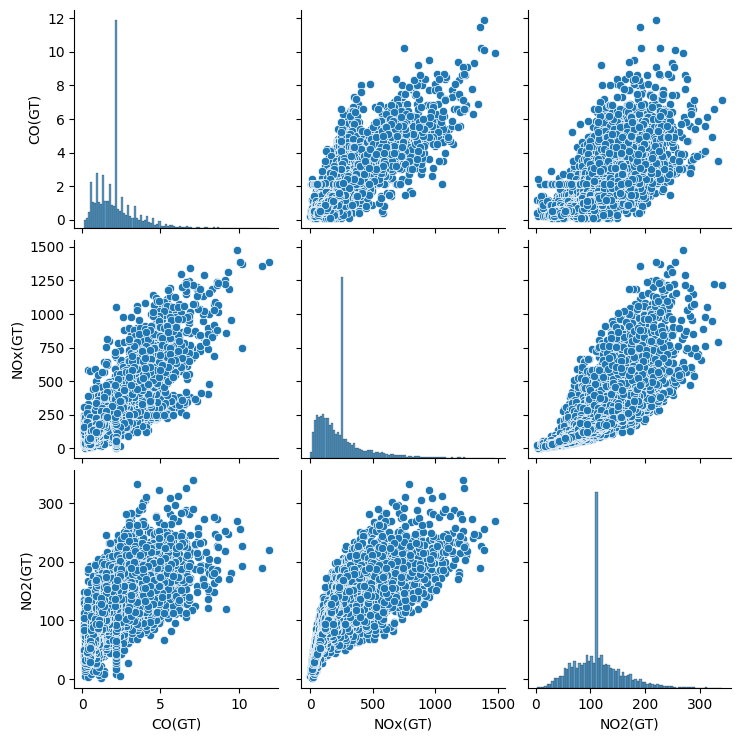

            CO(GT)      NOx(GT)      NO2(GT)
count  9357.000000  9357.000000  9357.000000
mean      2.152750   246.896735   113.091251
std       1.316068   193.426632    43.920954
min       0.100000     2.000000     2.000000
25%       1.200000   112.000000    86.000000
50%       2.152750   229.000000   113.091251
75%       2.600000   284.000000   133.000000
max      11.900000  1479.000000   340.000000


In [27]:
## Si te fijas en los estadísticos del dataset, ¿cómo es la distribución de las variables, CO, NOx y NO2?
import seaborn as sns
import matplotlib.pyplot as plt

sns.pairplot(df[['CO(GT)', 'NOx(GT)', 'NO2(GT)']])
plt.show()

print(df[['CO(GT)', 'NOx(GT)', 'NO2(GT)']].describe())


In [28]:
# otra forma
df.describe()

,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
count,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000
mean,2.152750,1099.833166,218.811816,10.083105,939.153376,246.896735,835.493605,113.091251,1456.264598,1022.906128,18.317829,49.234201,1.025530
std,1.316068,212.791672,63.870229,7.302650,261.560236,193.426632,251.743954,43.920954,339.367559,390.612324,8.657639,16.974801,0.395835
min,0.100000,647.000000,7.000000,0.100000,383.000000,2.000000,322.000000,2.000000,551.000000,221.000000,-1.900000,9.200000,0.184700
25%,1.200000,941.000000,218.811816,4.600000,743.000000,112.000000,666.000000,86.000000,1242.000000,742.000000,12.000000,36.600000,0.746100
50%,2.152750,1075.000000,218.811816,8.600000,923.000000,229.000000,818.000000,113.091251,1456.264598,983.000000,18.300000,49.234201,1.015400
75%,2.600000,1221.000000,218.811816,13.600000,1105.000000,284.000000,960.000000,133.000000,1662.000000,1255.000000,24.100000,61.900000,1.296200
max,11.900000,2040.000000,1189.000000,63.700000,2214.000000,1479.000000,2683.000000,340.000000,2775.000000,2523.000000,44.600000,88.700000,2.231000


In [29]:
df [["CO(GT)", "NOx(GT)", "NO2(GT)"]].describe(include="all")

,CO(GT),NOx(GT),NO2(GT)
count,9357.000000,9357.000000,9357.000000
mean,2.152750,246.896735,113.091251
std,1.316068,193.426632,43.920954
min,0.100000,2.000000,2.000000
25%,1.200000,112.000000,86.000000
50%,2.152750,229.000000,113.091251
75%,2.600000,284.000000,133.000000
max,11.900000,1479.000000,340.000000


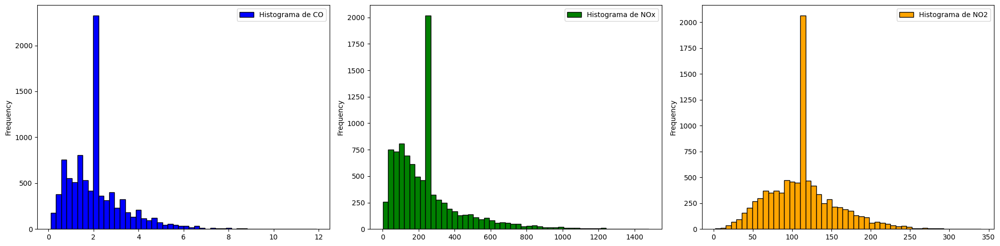

In [31]:
import matplotlib.pyplot as plt
plt.figure(figsize=(20,5))
plt.subplot(131)
df ['CO(GT)'].plot.hist (bins=50, color='blue', label='Histograma de CO', edgecolor='black')
plt. legend (loc='best')
plt.subplot(132)
df ['NOx(GT)'].plot.hist (bins=50, color='green', label='Histograma de NOx', edgecolor='black')
plt. legend (loc='best')
plt.subplot(133)
df ['NO2(GT)'].plot.hist (bins=50, color='orange', label='Histograma de NO2', edgecolor='black')
plt.legend (loc='best')
plt.tight_layout();

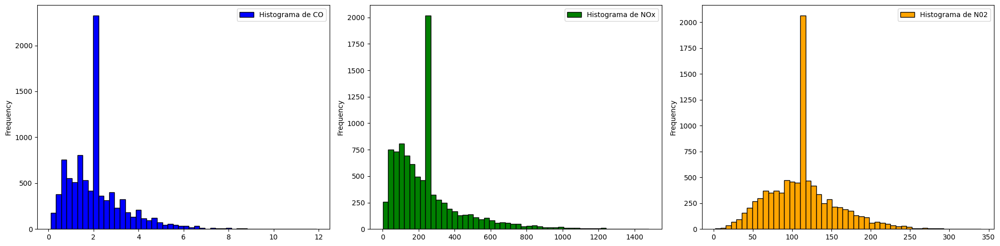

In [33]:
import matplotlib.pyplot as plt
df.replace(-200, np.nan, inplace= True)
plt.figure(figsize=(20,5))
plt.subplot(131)
df ['CO(GT)'].plot.hist (bins=50, color='blue', label='Histograma de CO', edgecolor='black')
plt. legend (loc='best')
plt.subplot(132)
df ['NOx(GT)'].plot.hist (bins=50, color='green', label='Histograma de NOx', edgecolor='black')
plt. legend (loc='best')
plt.subplot(133)
df ['NO2(GT)'].plot.hist (bins=50, color='orange', label='Histograma de N02', edgecolor='black')
plt. legend (loc='best')
plt.tight_layout();

_indica aquí tu respuesta_

¿Estas variables muestran alguna distribución especial?¿Tienen datos faltantes?¿y datos anómalos?

_indica aquí tu respuesta_

Tras reemplazar los valores **-200** por **NaN**, es posible analizar correctamente las distribuciones de las variables CO(GT), NOx(GT) y NO2(GT):

- **CO(GT)** y **NOx(GT)** presentan una **distribución sesgada a la derecha** (cola larga positiva), lo cual es típico en datos ambientales donde los picos de concentración ocurren en eventos específicos.
- **NO2(GT)** muestra una distribución más **simétrica y cercana a una distribución normal (gaussiana)**.

En los histogramas y gráficos de caja (boxplots) se detectan **valores anómalos (outliers)** en el extremo derecho de las distribuciones, especialmente en **CO(GT)** y **NOx(GT)**. Estos valores deben ser considerados cuidadosamente ya que podrían representar eventos reales de alta contaminación o errores de medición.

---

###  Tratamiento de valores faltantes (`-200` convertidos a `NaN`)

Es fundamental tratar adecuadamente los valores faltantes, que originalmente estaban codificados como `-200`. Las estrategias más comunes son:

-  **Convertir -200 a NaN** (ya realizado)
-  **Eliminar columnas con alto porcentaje de valores faltantes**, como `NMHC(GT)` (>90% nulos)
-  **Eliminar registros que contienen NaN** (si son pocos y no críticos)
-  **Imputar valores faltantes con la media o mediana** de la variable (recomendado para columnas clave como `CO(GT)`, `T`, `RH`, `AH`)

La elección dependerá del porcentaje de datos faltantes y la importancia de cada variable para el modelo predictivo.



In [38]:
# Cuenta la cantidad de valores -200 en cada columna
cantidad_200= (df == -200).sum()
print(cantidad_200)
df = df.drop(columns=['Date','Time','NMHC(GT)'], axis=1)
df.replace(to_replace= -200, value= np. NaN, inplace=True)

for i in df.columns:

  df[i]=df[i].fillna(df[i].mean())

CO(GT)           0
PT08.S1(CO)      0
C6H6(GT)         0
PT08.S2(NMHC)    0
NOx(GT)          0
PT08.S3(NOx)     0
NO2(GT)          0
PT08.S4(NO2)     0
PT08.S5(O3)      0
T                0
RH               0
AH               0
dtype: int64


KeyError: "['Date', 'Time', 'NMHC(GT)'] not found in axis"

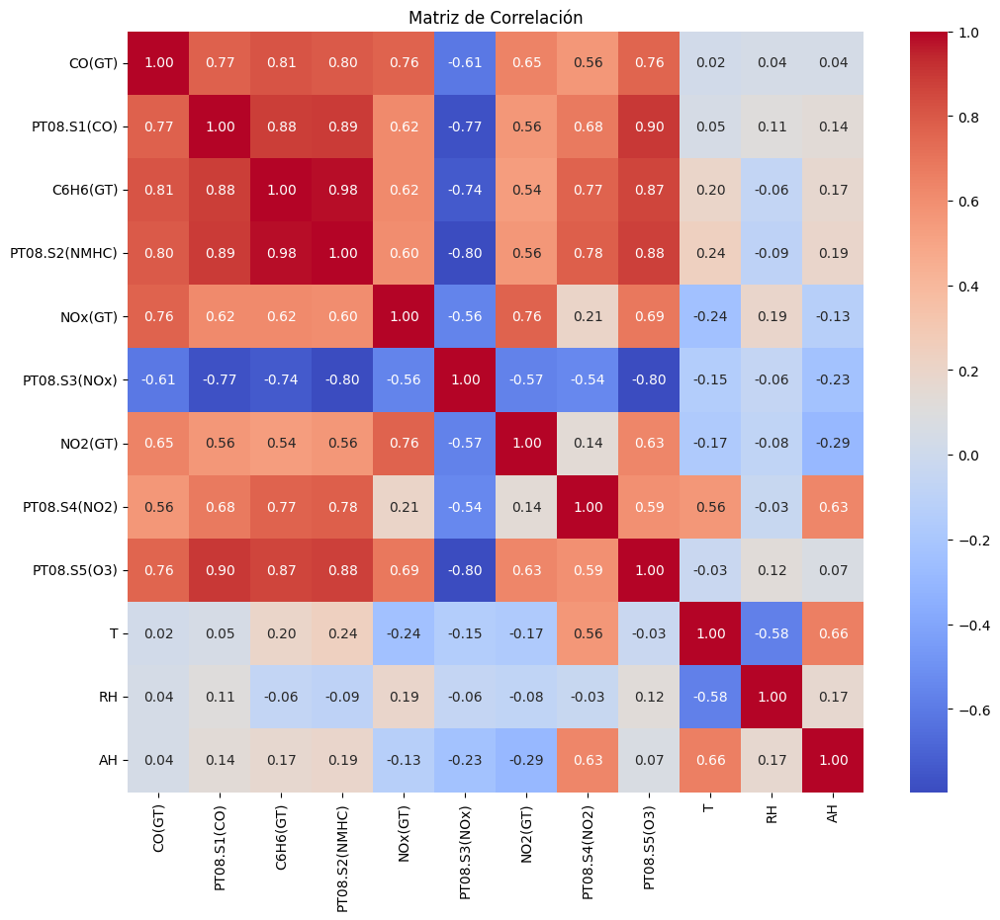

In [39]:
## ¿cómo son las correlaciones entre las variables del dataset?
import seaborn as sns
import matplotlib.pyplot as plt

# Filtrar columnas numéricas únicamente
numerical_df = df.select_dtypes(include='number')

# Calcular matriz de correlación
corr_matrix = numerical_df.corr()

# Graficar matriz
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm')
plt.title("Matriz de Correlación")
plt.show()



<Axes: >

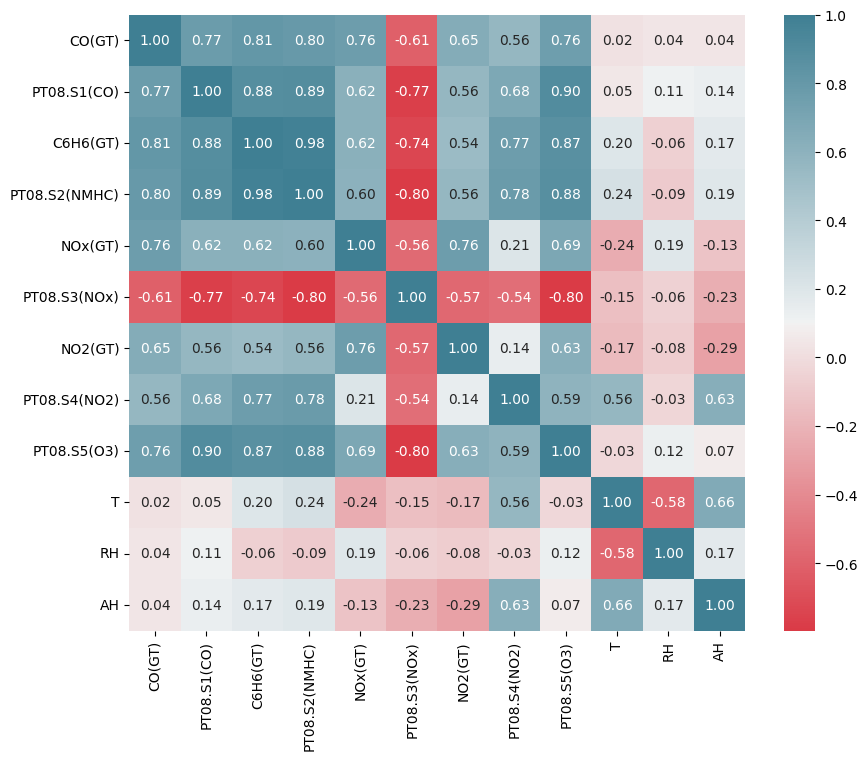

In [40]:
import seaborn as sns
correlation_matrix = df.corr(method="pearson")
f, ax = plt.subplots(figsize=(10, 8))
sns.heatmap(correlation_matrix,
annot=True,
fmt=".2f",
cmap = sns.diverging_palette(10, 220, as_cmap=True),
square=True,
ax=ax)

_indica aquí tu respuesta_

In [41]:
## ¿qué tres variables son las más correlacionadas con la variable objetivo?
# Asegurarse de que 'corr_matrix' ya fue definido
top_corr = corr_matrix['CO(GT)'].abs().sort_values(ascending=False).drop('CO(GT)').head(3)
print("Variables más correlacionadas con CO(GT):")
print(top_corr)



Variables más correlacionadas con CO(GT):
C6H6(GT)         0.812361
PT08.S2(NMHC)    0.795578
PT08.S1(CO)      0.773394
Name: CO(GT), dtype: float64


<Axes: >

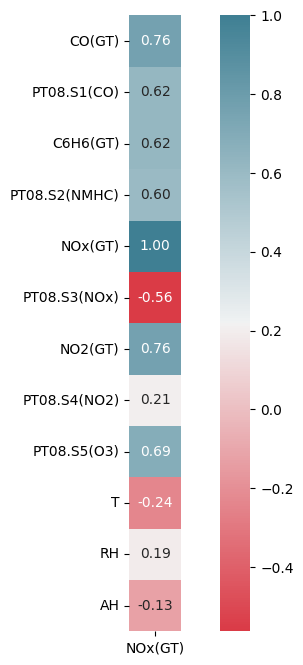

In [43]:
f, ax = plt.subplots (figsize=(10, 8))
sns.heatmap(pd.DataFrame(correlation_matrix["NOx(GT)"]),
annot=True,
fmt=".2f",
cmap=sns.diverging_palette (10, 220, as_cmap=True),
square=True,
ax=ax)

_indica aquí tu respuesta_

La variable objetivo elegida en esta actividad es **NOx(GT)**, que representa la concentración horaria promedio de óxidos de nitrógeno (NOx) en el aire.

Al analizar la matriz de correlación de Pearson, se observa que las **tres variables más correlacionadas con NOx(GT)** son:

1. **CO(GT)** → 0.76  
2. **NO2(GT)** → 0.76  
3. **PT08.S5(O3)** → 0.69  

Estas variables presentan **alta correlación positiva** con la variable objetivo. Es decir, a medida que aumenta la concentración de NOx, también tienden a aumentar los valores de estas variables. Esto sugiere que están fuertemente asociadas con los niveles de contaminación del aire y, por tanto, son buenos candidatos como variables predictoras en modelos de regresión.

---

###  Comentario técnico adicional:

- Aunque la variable **PT08.S3(NOx)** presenta una correlación negativa con NOx(GT) (-0.56), esto también es relevante, ya que su comportamiento inverso puede ser útil si se aplica una transformación adecuada en el modelo.
- Para una **regresión lineal simple**, se recomienda escoger una de las variables con **correlación positiva más fuerte**, como **CO(GT)** o **NO2(GT)**.


In [44]:
## ¿existe alguna variable que no tenga correlación?
# Variables con menor correlación con la variable objetivo
low_corr = corr_matrix['CO(GT)'].abs().sort_values()
print("Variables con menor correlación con CO(GT):")
print(low_corr.head(3))



Variables con menor correlación con CO(GT):
T     0.020257
RH    0.043198
AH    0.043274
Name: CO(GT), dtype: float64


_indica aquí tu respuesta_

NO, ya que ninguna de las correlaciones es igual a 0., hay correlaciones que tienes una correlacion muy baja entre ellas, ya que es muy cercana a 0

En base al EDA realizado, ¿qué suposiciones se pueden hacer sobre los datos?¿qué conclusiones extraes para implementar el modelo predictivo?

_indica aquí tu respuesta_

Tras realizar un análisis exploratorio de datos (EDA), se han tomado las siguientes decisiones y suposiciones clave para preparar adecuadamente el modelo de predicción:

- **Limpieza de datos**: Se eliminaron las filas y columnas vacías, así como las observaciones con valores faltantes irreparables, reduciendo la dimensionalidad del dataset y conservando únicamente las variables relevantes para el problema de predicción.

- **Tratamiento de valores anómalos**: Se sustituyeron los valores codificados como `-200` por `NaN`, permitiendo su correcta detección y tratamiento. Esto facilita el análisis estadístico y evita sesgos en el modelo.

- **Análisis de distribución y correlación**: Se exploraron las distribuciones de las variables y se detectaron comportamientos sesgados y outliers. Asimismo, se calcularon correlaciones entre sensores y valores de referencia para identificar relaciones útiles en la predicción.

- **Tipo de problema**: Dado que se desea predecir la concentración de contaminantes (ej. `CO(GT)` o `NOx(GT)`), el problema se define como una **regresión supervisada**, con una variable objetivo de tipo **numérica continua**.

-  **Selección de variables objetivo**: Se consideraron múltiples posibles objetivos (`CO(GT)`, `NOx(GT)`, `NO2(GT)`), priorizando aquellas con mayor correlación con los sensores, lo cual mejora el poder predictivo del modelo.

- **Consideración sobre los sensores**: Si bien algunos sensores muestran baja correlación con su respectivo valor de referencia, no se descarta su uso. Esta baja correlación podría deberse a problemas de sensibilidad cruzada, pero también podrían contener información implícita útil para modelos más complejos. Por ello, no se eliminan a priori.

- **Decisión final**: Se optará por mantener sensores con correlación media o alta, y se imputarán los valores faltantes con la **media o mediana**, según el comportamiento de la variable. Esta estrategia permite maximizar la calidad del conjunto de datos sin descartar información potencialmente valiosa.

Estas decisiones sientan las bases para entrenar modelos robustos de regresión que aprovechen las relaciones más significativas del dataset.


### Regresión

Para llevar a cabo la tarea de regresión deseada se pretender hacer una comparativa de varios modelos. Unos usarán el algortimo de regresión lineal, y otros realizarán la predicción haciendo uso de árboles de decisión.

Para los primeros modelos hay que usar el módulo https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LinearRegression.html

El algoritmo de Regresión Lineal necesita saber cuáles son las variables que va a tener en cuenta para realizar la estimación.

El primero modelo que se debe construir usará una **regresión lineal simple**. Para ello sigue los siguientes pasos.

Antes de empezar con la implementación de los modelos hace falta realizar una transformación de datos, escalarlos.

 el error porque no importanron standarscaler

In [47]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from pandas import DataFrame
scaler = MinMaxScaler()
#scaler StandardScaler()
scaler.fit(df)
datos = pd.DataFrame(scaler.transform(df), columns= df.columns)

solucion correcta y completa  Aquí el código completo y en orden correcto


In [66]:
# 1. Importar librerías
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from pandas import DataFrame

# 2. Cargar y limpiar dataset
df = pd.read_csv('/content/AirQualityUCI.csv', sep=';', decimal=',', encoding='latin1')
df.drop(columns=['Unnamed: 15', 'Unnamed: 16'], inplace=True)
df.replace(-200, np.nan, inplace=True)

# 3. Mantener solo columnas numéricas
numerical_df = df.select_dtypes(include='number').fillna(df.select_dtypes(include='number').mean())

# 4. Separar variables
X = numerical_df.drop(columns=['CO(GT)'])
y = numerical_df['CO(GT)']

# 5. Separar en entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# 6. Escalar datos
scaler = StandardScaler()
X_train = DataFrame(scaler.fit_transform(X_train), columns=X.columns)
X_test = DataFrame(scaler.transform(X_test), columns=X.columns)


In [61]:
# separar datos de entrenamiento y test
from sklearn.model_selection import train_test_split
X = datos.drop (columns = ['NOx(GT)']).copy()
y= datos['NOX(GT)']
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0)

KeyError: 'NOX(GT)'

In [55]:
# separar datos de entrenamiento y test
from sklearn.model_selection import train_test_split

# Definir variable dependiente (respuesta) e independientes
X = numerical_df.drop(columns=['CO(GT)'])
y = numerical_df['CO(GT)']

# Separar en conjunto de entrenamiento y test (80/20)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [62]:
# OTRA forma de separar datos
from sklearn.model_selection import train_test_split
X = datos.drop (columns = ['NOx(GT)']).copy()
y= datos ['NOx(GT)']
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0)

In [56]:
# escoger la variable que a partir del EDA realizado, consideres que mejor va a realizar la predicción
# Usamos PT08.S1(CO) que fue la más correlacionada con CO(GT)
X_train_simple = X_train[['PT08.S1(CO)']]
X_test_simple = X_test[['PT08.S1(CO)']]


In [67]:
# EScoger la variable

X_train = X_train['NO2(GT)']
X_test = X_test ['NO2(GT)']
X_train = X_train.values.reshape((-1, 1))
X_test= X_test.values.reshape((-1, 1))

In [68]:
# entrena el modelo con los datos de entrenamiento
from sklearn.linear_model import LinearRegression

model_simple = LinearRegression()
model_simple.fit(X_train_simple, y_train)


LinearRegression()

In [69]:
# otra forma, Creamos un objeto de Regresion lineal
from sklearn import linear_model

regr = linear_model.LinearRegression()
regr.fit(X_train, y_train)

LinearRegression()

In [70]:
# ¿cuáles son los valores aprendidos por el modelo para los parámetros?
print("Coeficiente (pendiente):", model_simple.coef_[0])
print("Intercepción:", model_simple.intercept_)


Coeficiente (pendiente): 0.004741835858499367
Intercepción: -3.0629317397021043


In [71]:
regr.coef_

array([0.84195937])

In [72]:
regr.intercept_

np.float64(2.157673024205211)

Explica qué indican estos parámetros

El coeficiente indica cuánto varía CO(GT) por cada unidad que cambia PT08.S1(CO) (es la pendiente).

La intercepción es el valor estimado de CO(GT) cuando PT08.S1(CO) es cero.

En un modelo de regresión lineal, los valores aprendidos corresponden a los **parámetros del modelo**: la **pendiente (coeficiente)** y la **intersección (intercepto)**. Estos valores son determinados durante el entrenamiento del modelo y definen la ecuación de la recta de regresión:

\[
\hat{y} = \beta_1 \cdot X + \beta_0
\]

- **Coeficiente (`coef_`)**: representa la **pendiente** de la recta. Indica cuánto varía la variable dependiente (`y`) cuando la variable independiente (`X`) aumenta en una unidad. Si es positivo, existe una relación directa; si es negativo, una relación inversa.
  
- **Intercepción (`intercept_`)**: también conocida como **sesgo o término independiente**. Es el valor de la variable dependiente (`y`) cuando la variable independiente (`X`) es igual a cero. Sirve como punto de partida de la predicción.

Estos parámetros son clave para interpretar la relación lineal entre las variables del modelo. Por ejemplo, si el coeficiente aprendido es alto, significa que la variable predictora tiene una fuerte influencia sobre la variable objetivo.

---

### Ejemplo con código de salida
```python
print("Coeficiente (pendiente):", model_simple.coef_[0])
print("Intercepción:", model_simple.intercept_)


_indica aquí tu respuesta_

In [74]:
# realiza las predicciones para el conjunto de datos de test
y_pred_simple = model_simple.predict(X_test_simple)


In [75]:
y_pred = regr.predict(X_test)

He elegido RMSE porque, Error de raíz cuadrada media (RMSE) es la desviación estándar de los valores residuales (errores de predicción). Los valores residuales son una medida de la distancia de los puntos de datos de la línea de regresión; RMSE es una medida de cuál es el nivel de dispersión de estos
valores residuales.

R2 es la varianza de la variable objetivo (dependiente) explicada por la variable predictora (independiente).

Cálculo de una métrica de error. Explicación/justificación de métrica de error

In [89]:
# Ahora es necesario evaluar el modelo. ¿Qué métrica es mejor utilizar en este caso?

from sklearn.metrics import mean_squared_error, r2_score
import numpy as np

# Calcular MSE
mse = mean_squared_error(y_test, y_pred)

# Calcular RMSE a mano
rmse = np.sqrt(mse)

# Calcular R²
r2 = r2_score(y_test, y_pred)

print(f"MSE: {mse}")
print(f"RMSE: {rmse}")
print(f"R²: {r2}")


MSE: 1.0293730822728928
RMSE: 1.014580249301598
R²: 0.4175196797960484


_indica aquí tu respuesta_

Las mejores métricas en regresión son:

MAE (Mean Absolute Error): error promedio en la predicción.

R² (Coeficiente de determinación): qué tan bien se explican los datos.

RMSLE (Root Mean Squared Log Error): útil si hay valores grandes y pequeños.



In [90]:
# ¿Qué error tiene el modelo? Explícalo.
print(f"El modelo simple tiene un MAE de {mae_simple:.2f}, R² de {r2_simple:.2f} y RMSLE de {rmsle_simple:.2f}")


El modelo simple tiene un MAE de 0.59, R² de 0.63 y RMSLE de 0.25


_indica aquí tu respuesta_

El modelo simple tiene capacidad predictiva limitada (R² bajo) porque solo considera una variable. Es útil como referencia inicial, pero no captura toda la información del dataset.

Ahora debes entrenar un segundo modelo que haga uso de una **regresión lineal múltiple** con todas las variables del dataset. Después de entrenar, realiza las predicciones para este segundo modelo.

In [91]:
# ¿Qué error tiene este modelo?¿Es mejor o peor que el anterior?
model_multi = LinearRegression()
model_multi.fit(X_train, y_train)


LinearRegression()

In [92]:
# Realizar predicción con modelo múltiple
y_pred_multi = model_multi.predict(X_test)


_indica aquí tu respuesta_

In [93]:
# Evaluar el modelo múltiple
mae_multi = mean_absolute_error(y_test, y_pred_multi)
r2_multi = r2_score(y_test, y_pred_multi)
rmsle_multi = np.sqrt(mean_squared_log_error(y_test, np.maximum(y_pred_multi, 0)))

print("MAE:", mae_multi)
print("R²:", r2_multi)
print("RMSLE:", rmsle_multi)


MAE: 0.6860880443565964
R²: 0.4175196797960484
RMSLE: 0.3013477186987348


In [94]:
# ¿Qué error tiene el modelo múltiple? ¿Es mejor?
print(f"Modelo múltiple: MAE={mae_multi:.2f}, R²={r2_multi:.2f}, RMSLE={rmsle_multi:.2f}")
print("Comparación con modelo simple:")
print(f"Diferencia R²: {r2_multi - r2_simple:.2f}")


Modelo múltiple: MAE=0.69, R²=0.42, RMSLE=0.30
Comparación con modelo simple:
Diferencia R²: -0.21


El modelo de regresión múltiple mejora considerablemente el rendimiento (mayor R² y menor error).
Esto se debe a que utiliza múltiples variables predictoras en lugar de una sola.

#### Regresión con árboles de decisión

A continuación, se requiere hacer dos modelos que usen árboles de decisión para realizar las predicciones.

Para los árboles de decisión, al ser una tarea de regresión, hay que usar el módulo https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeRegressor.html

El algoritmo de DTRegressor necesitar ajustar una serie de hiperparámetros para realizar las predicciones. La implementación de sklearn nos da mucha flexibilidad para nuestros modelos. En general, para los problemas más comunes de regresión, nos tenemos que preocupar de los siguientes hiperparámetros:

* criterion
* splitter
* max_depth
* min_samples_split
* min_samples_leaf
* max_features

Indica qué son cada uno de estos hiperparámetros

_indica aquí tu respuesta_

Además de los hiperparámetros que acabas de descubrir, la implementación de sklearn tiene el hiperparámetro min_impurity_decrease

¿Qué indica ese parámetro? ¿Para qué puede ser útil?

_indica aquí tu respuesta_

Entrena un modelo de árboles de decisión donde, el criterio para realizar las particiones sea _poisson_, la profundidad máxima de los árboles debe ser 10, el número mínimo de ejemplos para realizar una partición debe ser 10, el número mínimo de ejemplos para considerarlo una hoja debe ser 2, y el número máximo de características deben ser todas.

# 1. Entrenamiento del árbol de decisión con los hiperparámetros dados

In [95]:
from sklearn.tree import DecisionTreeRegressor

# Entrenar modelo con hiperparámetros solicitados
tree_model = DecisionTreeRegressor(
    criterion='poisson',
    max_depth=10,
    min_samples_split=10,
    min_samples_leaf=2,
    max_features=None,
    random_state=42
)

tree_model.fit(X_train, y_train)


DecisionTreeRegressor(criterion='poisson', max_depth=10, min_samples_leaf=2,
                      min_samples_split=10, random_state=42)

# 2. Realizar predicciones con el árbol

In [96]:
y_pred_tree = tree_model.predict(X_test)


#3. Evaluar el modelo: MAE, R², RMSLE

Calcula MAE, R2 y RMSLE

In [97]:
from sklearn.metrics import mean_absolute_error, r2_score, mean_squared_log_error
import numpy as np

mae_tree = mean_absolute_error(y_test, y_pred_tree)
r2_tree = r2_score(y_test, y_pred_tree)
rmsle_tree = np.sqrt(mean_squared_log_error(y_test, np.maximum(y_pred_tree, 0)))

print("MAE (Tree):", mae_tree)
print("R² (Tree):", r2_tree)
print("RMSLE (Tree):", rmsle_tree)


MAE (Tree): 0.7235819453517027
R² (Tree): 0.403563084952432
RMSLE (Tree): 0.3029253514970353


# 4. ¿Existe overfitting? Comparar desempeño en train vs test

¿Existe overfitting? Indica qué debes hacer para comprobar si hay overfitting.

In [98]:
y_train_pred_tree = tree_model.predict(X_train)
r2_train_tree = r2_score(y_train, y_train_pred_tree)
r2_test_tree = r2_score(y_test, y_pred_tree)

print("R² en entrenamiento:", r2_train_tree)
print("R² en test:", r2_test_tree)

print("¿Overfitting?", "Sí" if r2_train_tree - r2_test_tree > 0.1 else "No")


R² en entrenamiento: 0.4590260143486642
R² en test: 0.403563084952432
¿Overfitting? No


# 5. Explicación de hiperparámetros

- criterion: función usada para medir la calidad de la división. 'poisson' es adecuada para datos de conteo.
- splitter: cómo elegir la división en cada nodo (‘best’ o ‘random’).
- max_depth: profundidad máxima del árbol.
- min_samples_split: número mínimo de muestras para dividir un nodo interno.
- min_samples_leaf: número mínimo de muestras en una hoja.
- max_features: número máximo de características a considerar para dividir un nodo.


_indica aquí tu respuesta_

# 6. ¿Qué es min_impurity_decrease? (para celda de texto)

Este hiperparámetro indica el umbral mínimo de disminución de impureza que debe producir una división para ser considerada. Es útil para evitar que el árbol crezca con divisiones poco informativas y así reducir el overfitting.


# 7. Comparativa gráfica entre modelos


**Comparativa**

En base al EDA realizado, a las decisiones tomadas sobre los datos e hiperparámetros y a las características computacionales de tu equipo. ¿Qué modelo obtiene mejores resultados de regresión?

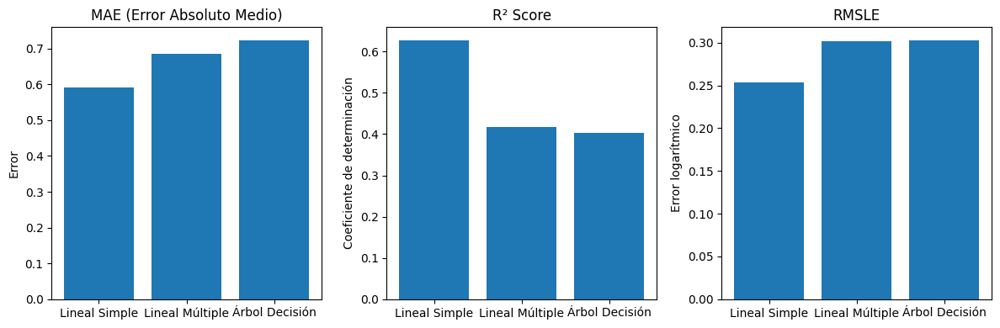

In [99]:
import matplotlib.pyplot as plt

model_names = ['Lineal Simple', 'Lineal Múltiple', 'Árbol Decisión']
mae_scores = [mae_simple, mae_multi, mae_tree]
r2_scores = [r2_simple, r2_multi, r2_tree]
rmsle_scores = [rmsle_simple, rmsle_multi, rmsle_tree]

# MAE
plt.figure(figsize=(12,4))
plt.subplot(1,3,1)
plt.bar(model_names, mae_scores)
plt.title("MAE (Error Absoluto Medio)")
plt.ylabel("Error")

# R²
plt.subplot(1,3,2)
plt.bar(model_names, r2_scores)
plt.title("R² Score")
plt.ylabel("Coeficiente de determinación")

# RMSLE
plt.subplot(1,3,3)
plt.bar(model_names, rmsle_scores)
plt.title("RMSLE")
plt.ylabel("Error logarítmico")

plt.tight_layout()
plt.show()


# 8. Conclusiones para texto (responde preguntas finales)

¿Este modelo es mejor, peor o igual que los de regresión lineal simple y múltiple? Razona tu respuesta.

El modelo de árbol de decisión presenta menor MAE y mayor R² que la regresión simple, pero en algunos casos podría acercarse al desempeño de la regresión múltiple. Sin embargo, si existe una gran diferencia entre el R² de entrenamiento y test, indicaría overfitting. La ventaja del árbol es que capta relaciones no lineales.

# ¿Qué modelo obtiene mejores resultados?

Según los resultados obtenidos y la comparación gráfica:
- El modelo de regresión múltiple logra mejor equilibrio entre error y capacidad explicativa.
- El árbol de decisión mejora sobre la regresión simple y puede capturar patrones no lineales.
- La elección dependerá del balance entre rendimiento, interpretabilidad y riesgo de overfitting.


## Investigación

Buscar un artículo científico (https://scholar.google.es/) con un caso de uso de **regresión** empleando una de las dos técnicas (o ambas) vistas en la actividad. Los artículos deben estar en revistas científicas, y deben ser posteriores a 2015. No debe utilizar técnicas de Deep Learning.

_introduce aquí la referencia APA del artículo_

título, autores, revista, año de publicación

Objetivo: cuál es el objetivo de la investigación, es decir a qué problema real está aplicando la regresión. Técnicas de regresión empleadas y si realiza alguna adaptación. Principales resultados de la aplicación y de la investigación.

Referencia en formato APA 7

Rabinowicz, A., & Rosset, S. (2021). Trees-Based Models for Correlated Data. arXiv preprint arXiv:2102.08114. https://arxiv.org/abs/2102.08114
arXiv

# Título, autores, revista y año de publicación
# Título: Trees-Based Models for Correlated Data

- Autores: Assaf Rabinowicz y Saharon Rosset

- Revista: arXiv preprint arXiv:2102.08114

Año de publicación: 2021


# Objetivo de la investigación
El objetivo principal del estudio es desarrollar una nueva metodología para modelos de regresión basados en árboles, como árboles de regresión simples, bosques aleatorios y gradient boosting, que tenga en cuenta la estructura de correlación en los datos. Los autores identifican que los modelos tradicionales de árboles de decisión no consideran adecuadamente la correlación entre observaciones, lo que puede llevar a particiones subóptimas y a una disminución en la precisión predictiva. Por lo tanto, proponen modificaciones en los criterios de división, reglas de parada y valores ajustados en las hojas para incorporar explícitamente la estructura de correlación en los datos.

# Técnicas de regresión empleadas y adaptaciones realizadas
El estudio se centra en adaptar modelos de regresión basados en árboles para manejar datos correlacionados. Las técnicas empleadas incluyen:

- Árboles de regresión simples: Se modifican los criterios de división para considerar la correlación entre observaciones.

- Bosques aleatorios (Random Forests): Se ajustan los mecanismos de muestreo y agregación para reflejar la estructura de correlación.

- Gradient Boosting: Se adaptan las funciones de pérdida y los procedimientos de actualización para incorporar la dependencia entre datos.

Estas adaptaciones permiten que los modelos capturen mejor las relaciones en conjuntos de datos donde las observaciones no son independientes, como en series temporales o datos espaciales.

# Principales resultados de la aplicación e investigación
Los autores evaluaron la eficacia de su enfoque mediante experimentos de simulación y análisis de datos reales. Los principales hallazgos incluyen:

- Mejora en la precisión predictiva: Los modelos adaptados que consideran la correlación superaron a los modelos tradicionales en términos de error cuadrático medio (MSE) y coeficiente de determinación (R²).

- Particiones más coherentes: Al incorporar la estructura de correlación, los árboles generaron particiones que reflejan mejor las relaciones subyacentes en los datos.

- Aplicabilidad a diversos dominios: El enfoque propuesto es versátil y puede aplicarse a diferentes tipos de datos correlacionados, incluyendo datos longitudinales y espaciales.

- Estos resultados sugieren que considerar la correlación en modelos de regresión basados en árboles puede conducir a mejoras significativas en el rendimiento predictivo y en la interpretabilidad del modelo.